<a href="https://colab.research.google.com/github/vahidseydi/ReinforcementLearning/blob/master/Reinforcement_Learning_QLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h3 align="center">
<img src="https://raw.githubusercontent.com/vahidseydi/ReinforcementLearning/master/mountaincar.png" alt="Smiley face" height="200" width="250">
</h3>

<h1> Technical details $ (M={S,A,T,R})$</h1>

<h2> S: States :</h2>

<font color="gray">
$ Velocity = [-0.07, -0.07] \\
Position = [-1.2, 0.6] \\
Start : Velocity=0, Position=-0.5 \\
End   : Position>=0.5 $
</font>

<h2> A: Actions :</h2>

<font color="gray">
$Action = [Left(1),Nutral(0),Right(-1)] $ 
</font>

<h2> T: Transition Function :</h2>

<font color="gray">
$Velocity = Velocity + 0.001 \times Action   - 0.0025 \times cos(3 \times Position) $ 

$Position = Position + Velocity  $
</font>

<h2> R: Rewards :</h2>

<font color="gray">
For every time step: reward=-1
</font>



In [0]:
import numpy as np


import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


import matplotlib.image as mpimg
import matplotlib.animation as animation
from scipy import ndimage
import cv2
import io

class render:
  def __init__(self,path,position):
    src= "https://raw.githubusercontent.com/vahidseydi/ReinforcementLearning/master/mc.png"
    self.Object= mpimg.imread(src)
    self.path=path
    self.position=position

  def set_object_list(self):
    im=self.Object
    get_angle = lambda slope:np.rad2deg(np.arctan(slope))
    normal =lambda im:(im * 255).astype(np.uint8)
    self.obj_list=[ normal(ndimage.rotate(im, get_angle(v),cval=1)) for v in self.position.df]
    
  def set_image_list(self):
    ims=[]   
    for i in range(len(self.position.x)):
      fig= plt.figure()
      ax = fig.gca()
      #ax.axes(xlim=(-1, 1), ylim=(-1, 1))
      ax.plot(self.path.x,self.path.f,'-b')
      imagebox = OffsetImage(self.obj_list[i], zoom=0.1)
      
      ax.axis('off')
      ab = AnnotationBbox(imagebox, (self.position.x[i], self.position.f[i]),frameon=False)
      ax.add_artist(ab)

      buf = io.BytesIO()
      fig.savefig(buf, format="png", dpi=180)
      
      buf.seek(0)
      img_arr = np.frombuffer(buf.getvalue(), dtype=np.uint8)
      buf.close()
      img = cv2.imdecode(img_arr, 1)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
      ims.append(img)
      plt.close()
    self.ims=ims

  def init(self):
    self.img.set_data(self.ims[0])
    return (self.img,)

  def animate(self,i):    
    self.img.set_data(self.ims[i])
    return (self.img,)
    
  def show(self):
    self.set_object_list()
    self.set_image_list()
    fig = plt.figure(figsize=(12,8))
    ax = fig.gca()
    self.img = ax.imshow(self.ims[0])
    anim = animation.FuncAnimation(fig, self.animate, init_func=self.init,
                                 frames=len(self.ims), interval=40, blit=True)
    return anim   

class path:
  def __init__(self,x,grad=False):
    f= lambda x:np.sin(3 * x)*.45+.55
    df = lambda x:0.45* 3*np.cos(3*x)
    self.x = x
    self.f = f(x)
    if grad:
      self.df = df(x)



In [0]:
import gym
import numpy as np
import matplotlib.pyplot as plt
from IPython import display
from IPython.display import HTML

import time

In [3]:
env = gym.make('MountainCar-v0')
state=env.reset()
state

array([-0.46208161,  0.        ])

# I want to get some information(states and actions) about this problrm!

In [4]:
print('State space:', env.observation_space)
print('Action space:', env.action_space)

State space: Box(2,)
Action space: Discrete(3)


## It means each state consist of two variables(horizontal position and velocity) and there are 3 actions(left, right, nothing).

In [5]:
print(env.observation_space.low)
print(env.observation_space.high)

[-1.2  -0.07]
[0.6  0.07]


## The horizontal position is between [-1.2, 0.6] and
## the velocity is between [-0.07, 0.07]
## the peak of the second mountain is positioned in 0.5, it means if the car passes from this position, it will succeed.

#for building a Q-table, the states must be discrete

In [0]:
s_positions = env.observation_space.low[0]
e_positions = env.observation_space.high[0]
n_positions=20

s_velocities = env.observation_space.low[1]
e_velocities = env.observation_space.high[1]
n_velocities=100

states_positions = np.linspace(start=s_positions , stop = e_positions  ,num = n_positions )
states_velocities= np.linspace(start=s_velocities, stop = e_velocities ,num = n_velocities)

n_actions = env.action_space.n


In [7]:
#Q = np.zeros([n_positions, n_velocities, n_actions])
#Q = np.random.randn(n_positions, n_velocities, n_actions)
Q = np.random.uniform(low = -1, high = 1, 
                          size = (n_positions, n_velocities, n_actions))
Q.shape

(20, 100, 3)

In [0]:
reward_list = []

In [0]:
learning_rate, discount, epsilon, min_eps, num_episodes= 0.2, 0.9, 0.8, 0, 5000
#learning_rate, discount, epsilon, min_eps, num_episodes= 0.1, 0.9, 0.8, 0, 2000

# Calculate episodic reduction in epsilon
reduction = (epsilon - min_eps)/(num_episodes)

In [10]:
for i in range(num_episodes):  

  done = False
  tot_reward, reward = 0,0
  state_pos,state_vel = env.reset()

  idx_state_pos=np.argmin(np.abs(state_pos - states_positions ))
  idx_state_vel=np.argmin(np.abs(state_vel - states_velocities))
  
  while done != True:

    if np.random.random() < 1 - epsilon:
        action = np.argmax(Q[idx_state_pos, idx_state_vel,:]) 
    else:
        action = np.random.randint(0, env.action_space.n)
    
    state2, reward, done, info = env.step(action) 

    tot_reward += reward

    idx_state_pos2 = np.argmin(np.abs(state2[0] - states_positions ))
    idx_state_vel2 = np.argmin(np.abs(state2[1] - states_velocities))

    if state2[0] >= 0.5:             
        Q[idx_state_pos, idx_state_vel,action]=reward
        break 
     # Adjust Q value for current state
    # Q(S1,A1)=Q(S1,A1)+ learning_rate [ r + discount * Q(S2,A2)-Q(S1,A1)]
    delta = learning_rate * (reward + discount*np.max(Q[idx_state_pos2, idx_state_vel2,:]) - 
                          Q[idx_state_pos, idx_state_vel,action])
    Q[idx_state_pos, idx_state_vel,action] += delta

     
    idx_state_pos,idx_state_vel = idx_state_pos2,idx_state_vel2
  #---------------------------------------------------------------------
  #                 end of while
  #---------------------------------------------------------------------
  # Decay epsilon
  if epsilon > min_eps:
      epsilon -= reduction
  
  # Track rewards
  reward_list.append(tot_reward)
  
  if (i+1) % 100 == 0:
      print('Episode {} Reward: {}'.format(i+1, np.mean(reward_list[i-100+1:i])))      
     
  #-------------------------------------------------------------------
  #                       end of for
  #-------------------------------------------------------------------
env.close()




Episode 100 Reward: -200.0
Episode 200 Reward: -200.0
Episode 300 Reward: -200.0
Episode 400 Reward: -200.0
Episode 500 Reward: -200.0
Episode 600 Reward: -200.0
Episode 700 Reward: -200.0
Episode 800 Reward: -200.0
Episode 900 Reward: -200.0
Episode 1000 Reward: -200.0
Episode 1100 Reward: -200.0
Episode 1200 Reward: -200.0
Episode 1300 Reward: -200.0
Episode 1400 Reward: -200.0
Episode 1500 Reward: -200.0
Episode 1600 Reward: -200.0
Episode 1700 Reward: -200.0
Episode 1800 Reward: -200.0
Episode 1900 Reward: -200.0
Episode 2000 Reward: -200.0
Episode 2100 Reward: -200.0
Episode 2200 Reward: -200.0
Episode 2300 Reward: -200.0
Episode 2400 Reward: -200.0
Episode 2500 Reward: -200.0
Episode 2600 Reward: -200.0
Episode 2700 Reward: -200.0
Episode 2800 Reward: -199.94949494949495
Episode 2900 Reward: -199.93939393939394
Episode 3000 Reward: -199.2929292929293
Episode 3100 Reward: -199.0
Episode 3200 Reward: -198.82828282828282
Episode 3300 Reward: -199.5151515151515
Episode 3400 Reward: -

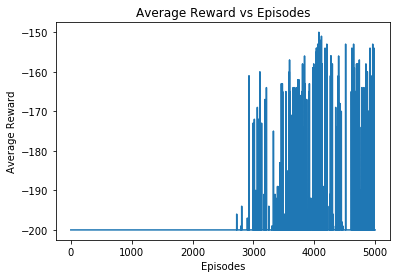

In [11]:
# Plot Rewards
plt.plot(np.arange(len(reward_list)), reward_list)
plt.xlabel('Episodes')
plt.ylabel('Average Reward')
plt.title('Average Reward vs Episodes')
plt.show()  

In [12]:
state_pos,state_vel=env.reset()
position_list=[]
n_try =0
TF=True
while(True):

  n_try+=1
  if n_try==300:
    break


  position_list.append(state_pos)

  idx_state_pos=np.argmin(np.abs(state_pos - states_positions ))
  idx_state_vel=np.argmin(np.abs(state_vel - states_velocities))

  action = np.argmax(Q[idx_state_pos, idx_state_vel,:]) 

  next_state, _, done, _ = env.step(action)   

  if done and TF:
    print(n_try)
    TF=False
  if next_state[0]>=0.5:
    break

  state_pos = next_state[0]
  state_vel = next_state[1]

200


In [13]:
print(next_state)
print(n_try)

[0.51966522 0.03422644]
249


In [0]:
x=np.arange(-1.2,0.6,0.001)
main_path = path(x)
position  = path(np.array(position_list),grad=True)


In [15]:
%matplotlib notebook
env_ren=render(main_path,position)
anim=env_ren.show()
HTML(anim.to_html5_video())


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py", line 216, in process
    func(*args, **kwargs)
  File "/usr/local/lib/python3.6/dist-packages/matplotlib/animation.py", line 1465, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'
